In [1]:
from pathlib import Path
import os 
# add ../ to path
# added_path = os.path.abspath(str((Path.cwd().parent.parent / "lib")).__str__())
# if added_path not in os.sys.path:
#     os.sys.path.append(added_path)  

project_main_path = Path.cwd().parent.parent
assert project_main_path.name == 'EC523_Project_G_old'
added_path = os.path.abspath(project_main_path.__str__())
if added_path not in os.sys.path:
    os.sys.path.append(added_path)  



PHASE3_SCENE_DESCRIPTION_FILE_TRAIN = "./DATASET/PROCESSING_RECORD_PHASE3_SCENE_DESCRIPTION_train.json"

PHASE3_SCENE_DESCRIPTION_FILE_TEST = "./DATASET/PROCESSING_RECORD_PHASE3_SCENE_DESCRIPTION_test.json"
dataset_path = os.path.abspath(project_main_path) # adjust the path to the dataset
project_main_path = Path.cwd().parent


In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl

In [3]:
from pathlib import Path
import os
import importlib
import torch
from transformers import AutoTokenizer, PretrainedConfig
from matplotlib import pyplot as plt
import argparse
from lib import data
import importlib 
from lib import data as anime_data
importlib.reload(anime_data)
import torch

import importlib
importlib.reload(anime_data)

from torch.utils.data import DataLoader
from torchvision import transforms

In [4]:
MAX_NUM_FIGURE = 5
BATCH_SIZE = 1
DATASET_SHUFFLE = True

Start Loading Metadata...
series_name: usagi_s1_
series_name: cute
Finish Loading Metadata...
Start Loading Metadata...
series_name: usagi_s1_
series_name: cute
Finish Loading Metadata...
dict_keys(['scene_img', 'inpainting_img', 'figure_img_list', 'len_figure', 'description'])
len_train: 7486, len_test: 572
dataset_train: 7486, dataset_test: 572


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


 The image features a woman with black hair and a red shirt, wearing a pair of bangs. She is looking at another woman who is wearing a red shirt and has a pair of bangs as well. The two women are standing in front of a cabinet, possibly in a kitchen setting. The scene appears to be a casual interaction between the two individuals.
 The image features a white cat figurine sitting on a table next to a plate of food. The cat is positioned towards the left side of the table, while the plate is located on the right side. The scene appears to be a casual dining setting, with the cat figurine adding a playful touch to the atmosphere.


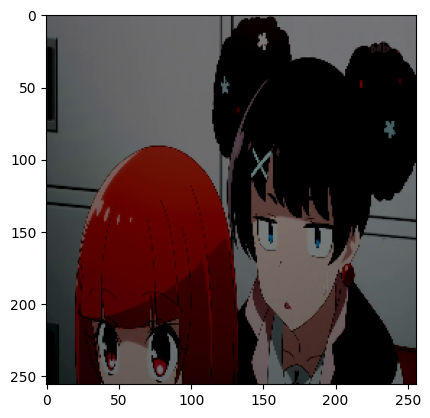

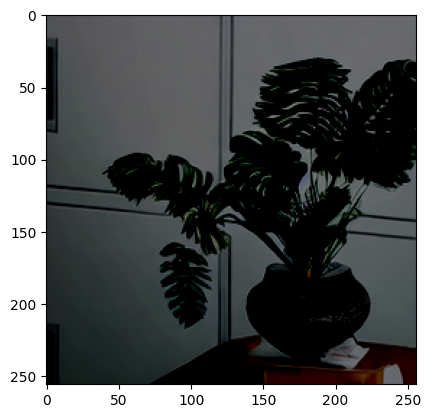

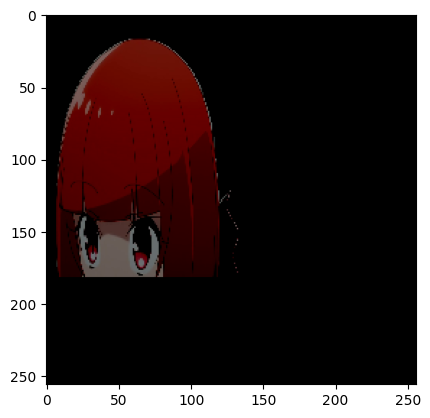

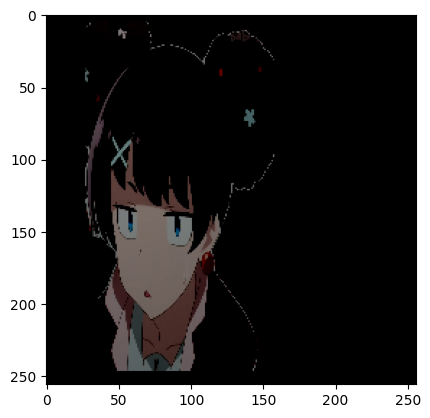

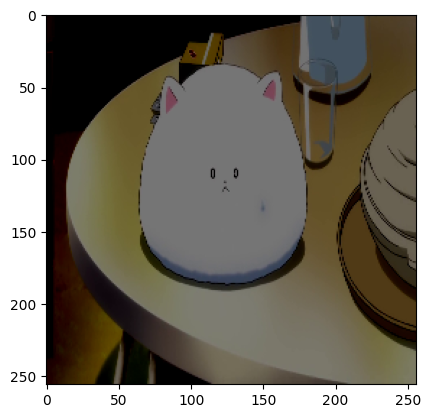

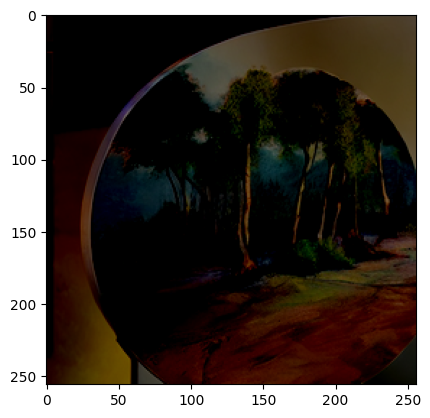

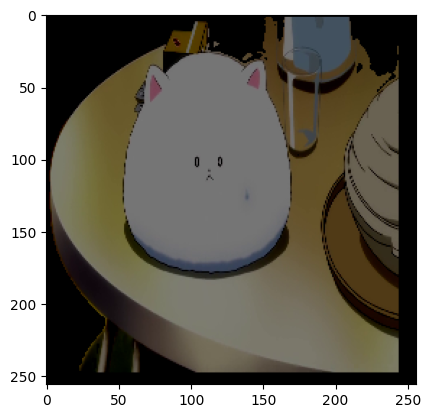

In [5]:
anime_figure_scene_dataset_train = anime_data.get_dataset(PHASE3_SCENE_DESCRIPTION_FILE_TRAIN, dataset_path=dataset_path, MAX_NUM_FIGURE=MAX_NUM_FIGURE)
# print(len(anime_figure_scene_dataset))
anime_figure_scene_dataset_test= anime_data.get_dataset(PHASE3_SCENE_DESCRIPTION_FILE_TEST, dataset_path=dataset_path, MAX_NUM_FIGURE=MAX_NUM_FIGURE)
print(anime_figure_scene_dataset_train[0].keys())


# import torch
# from torch.utils.data import  DataLoader

len_train = len(anime_figure_scene_dataset_train)
len_test = len(anime_figure_scene_dataset_test)
# len_train = int(1.0 * len_dataset)
# len_test = len_dataset - len_train
print(f"len_train: {len_train}, len_test: {len_test}")
dataset_train = torch.utils.data.Subset(anime_figure_scene_dataset_train, range(0, len_train))
dataset_test = torch.utils.data.Subset(anime_figure_scene_dataset_test, range(0,len_test))
print(f"dataset_train: {len(dataset_train)}, dataset_test: {len(dataset_test)}")






dataloader_train = DataLoader(dataset_train, batch_size=BATCH_SIZE, shuffle=DATASET_SHUFFLE)
dataloader_test = DataLoader(dataset_test, batch_size=BATCH_SIZE, shuffle=DATASET_SHUFFLE)

anime_data.display_data(dataloader_train, num_of_batch=1)
anime_data.display_data(dataloader_test, num_of_batch=1)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 dict_keys(['scene_img', 'inpainting_img', 'figure_img_list', 'len_figure', 'description'])
Scene image 
torch.Size([4, 3, 256, 256])
inpainting image
[" In a lush green forest, a young woman with long red hair and a pink shirt stands by a small stream. She is wearing a white tank top and appears to be looking at the water. The woman is a warrior, and she has just returned from a long journey. She is contemplating her next move, possibly deciding on her next course of action.\n\nAs she stands by the stream, she remembers the events that led her to this point. She had been on a mission to retrieve a magical artifact, and she had encountered a group of bandits along the way. The warrior had fought bravely, and she had managed to defeat the bandits, but not without some injuries. She had taken a moment to rest and tend to her wounds before continuing her journey.\n\nThe warrior's journey had been long and arduous, and she was tired. She had been traveling for days, and she was eager to r

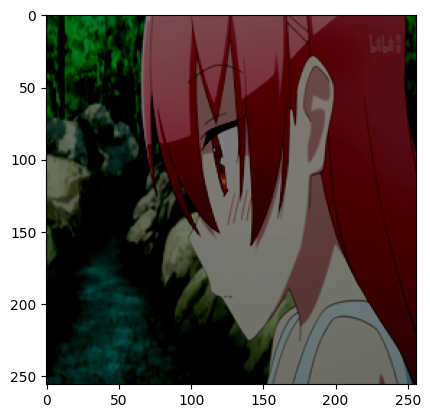

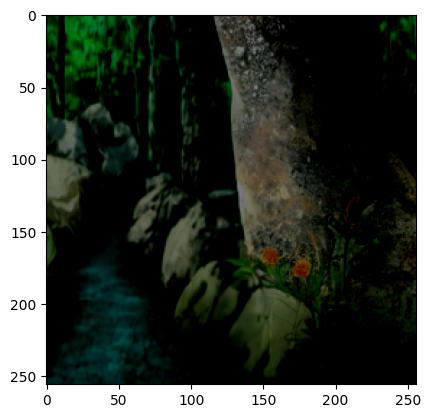

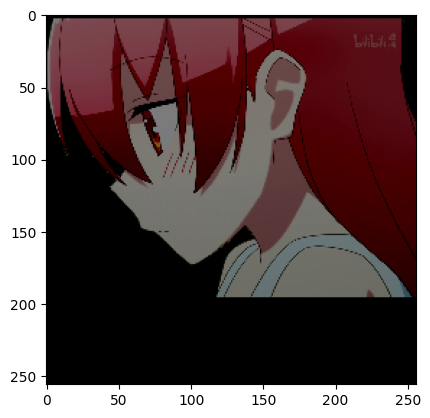

In [5]:


for i_batch, x in enumerate(dataloader_train):
    print(i_batch, x.keys())
    plt.figure()
    print("Scene image ")
    print(x['scene_img'].shape)
    plt.imshow(x['scene_img'][0].permute(1,2,0))
    plt.figure()
    print("inpainting image")
    plt.imshow(x['inpainting_img'][0].permute(1,2,0))
    num_figure=x['len_figure']
    print(x['description'])
    for i in range(num_figure[0]):
        plt.figure()
        plt.imshow(x['figure_img_list'][0][i].permute(1,2,0))
    #     plt.figure()
    #     plt.imshow(inpainting_img[0].permute(1,2,0))

    #     for i in range(num_figure[0]):
    #         plt.figure()
    #         plt.imshow(figure_img_list[0][i].permute(1,2,0))
    # anime_data.display_data(x['scene_img'], 1)
    break
    #continue

for i_batch, x in enumerate(dataloader_test):
    print(i_batch, x.keys())
    break
    #continue

## Start Training

In [5]:
from start import init_train
from utils.images import SaveImages

# Loading models and the latest weights without loading the dataset
Trainer = init_train("configs/StyleGAN_256.json",dataloader_train, dataloader_test)
Trainer.train_loop()
# Save 1000 randomly generated images to the img/256_2 folder
SaveImages(Trainer, dir='img/256_2', cnt=1000)

Epoch 623/10000 D_loss: 0.44 G_loss: 0.73:   3%|▎         | 208/7486 [11:55<6:57:10,  3.44s/it]


KeyboardInterrupt: 

## Evaluation

In [11]:
from start import init_train
from utils.images import SaveImages

# Loading models and the latest weights without loading the dataset
Trainer = init_train("configs/StyleGAN_256.json",dataloader_train, dataloader_test)
Trainer.eval_loop()
# Save 1000 randomly generated images to the img/256_2 folder
SaveImages(Trainer, dir='img/256_2', cnt=1000)

Generator(
  (mapping): Mapping(
    (blocks): ModuleList(
      (0-7): 8 x Sequential(
        (0): Linear(in_features=256, out_features=256, bias=True)
        (1): LeakyReLU(negative_slope=0.2)
      )
    )
  )
  (to_rgb): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1))
  (blocks): ModuleDict(
    (res 4): BlockG(
      (up_sample): Upsample(scale_factor=2.0, mode='bilinear')
      (Conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (AdaIN1): AdaIN(
        (A): Linear(in_features=256, out_features=1024, bias=True)
      )
      (Conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (Act): LeakyReLU(negative_slope=0.2)
      (AdaIN2): AdaIN(
        (A): Linear(in_features=256, out_features=1024, bias=True)
      )
    )
    (res 8): BlockG(
      (up_sample): Upsample(scale_factor=2.0, mode='bilinear')
      (Conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (AdaIN1): AdaIN(
        (A): Li

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: elly-yitong. Use `wandb login --relogin` to force relogin


  0%|          | 0/572 [00:00<?, ?it/s]/projectnb/aclab/ellywang/.conda/envs/conda_env/lib/python3.8/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
  3%|▎         | 17/572 [00:23<12:57,  1.40s/it]


KeyboardInterrupt: 

## Some Visualization

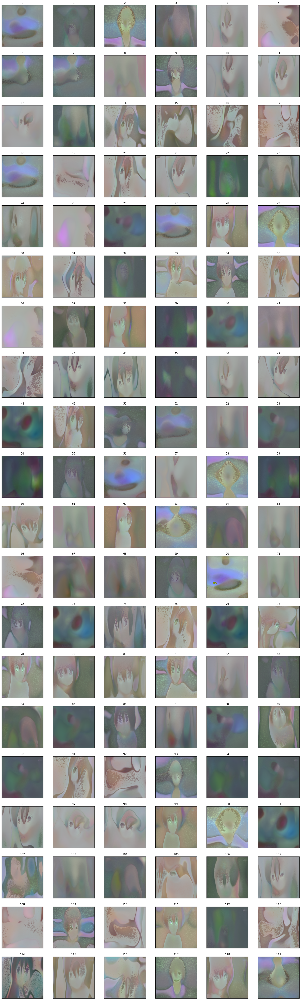

In [6]:
from utils.images import TensorToImage

plot_width, plot_height = 6, 20
fig = plt.figure(figsize=(4 * plot_width, 4 * plot_height))

z = torch.randn((plot_width * plot_height, 256), device=Trainer.device)
for sample_n in range(1, plot_width * plot_height + 1):
    ax = fig.add_subplot(plot_height, plot_width, sample_n)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.imshow(TensorToImage(Trainer.G(z[sample_n - 1])[0].detach().cpu(), 0.5, 0.4))
    plt.title(sample_n - 1)